# Задание

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import bar_chart_race as bcr

In [8]:
data = pd.read_csv('../datasets/kaggle_survey_2022_responses.csv', low_memory=False)
data.drop(0, inplace=True)
name2question = data.iloc[0] 

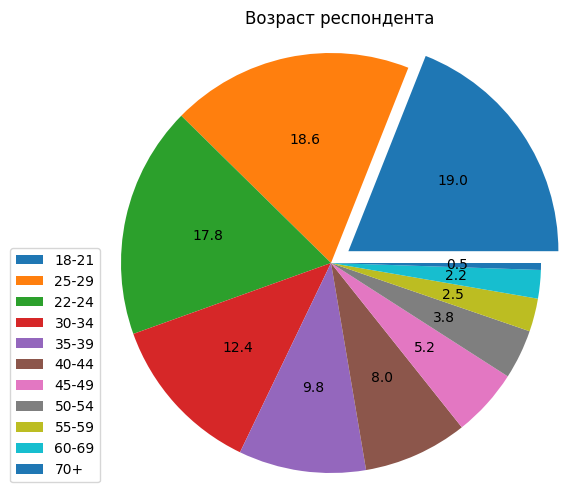

In [9]:
vals = list(data['Q2'].value_counts().index)
znac = list(data['Q2'].value_counts())
myexp=[0.1, 0.0, 0.0, 0,0,0,0,0,0,0,0]
plt.subplots(figsize=(6,6))
plt.pie(znac, labels=vals, autopct='%1.1f', explode = myexp, labeldistance=None)
plt.axis('equal')
plt.legend(loc='lower right', bbox_to_anchor=(0.0, 0.01), labels=vals, fontsize=10)
plt.title("Возраст респондента")
plt.show()

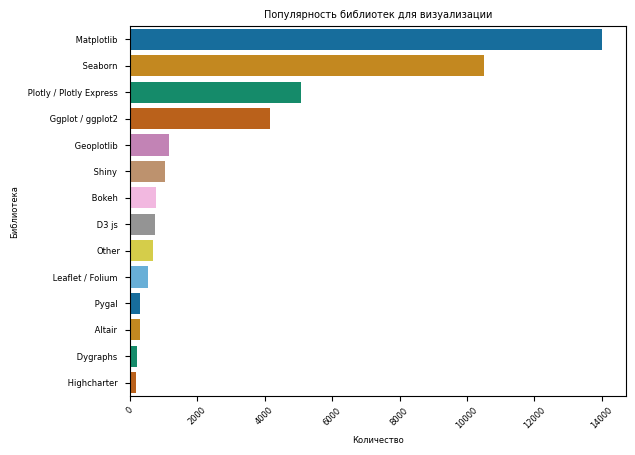

In [10]:
# Код тут
Q15 = [col for col in data.columns if col.startswith('Q15')]
data[Q15]
platforms = data[Q15].melt().dropna()

count_list = platforms.value_counts()
platforms_list = platforms['value'].value_counts().index

ax = sns.barplot (x = count_list, y = platforms_list, palette = "colorblind")
plt.xlabel('Количество', fontsize = 6)
plt.ylabel('Библиотека', fontsize = 6)
plt.title('Популярность библиотек для визуализации', fontsize = 7)
plt.xticks(rotation = 45, fontsize = 6)
plt.yticks( fontsize = 6)

plt.show()

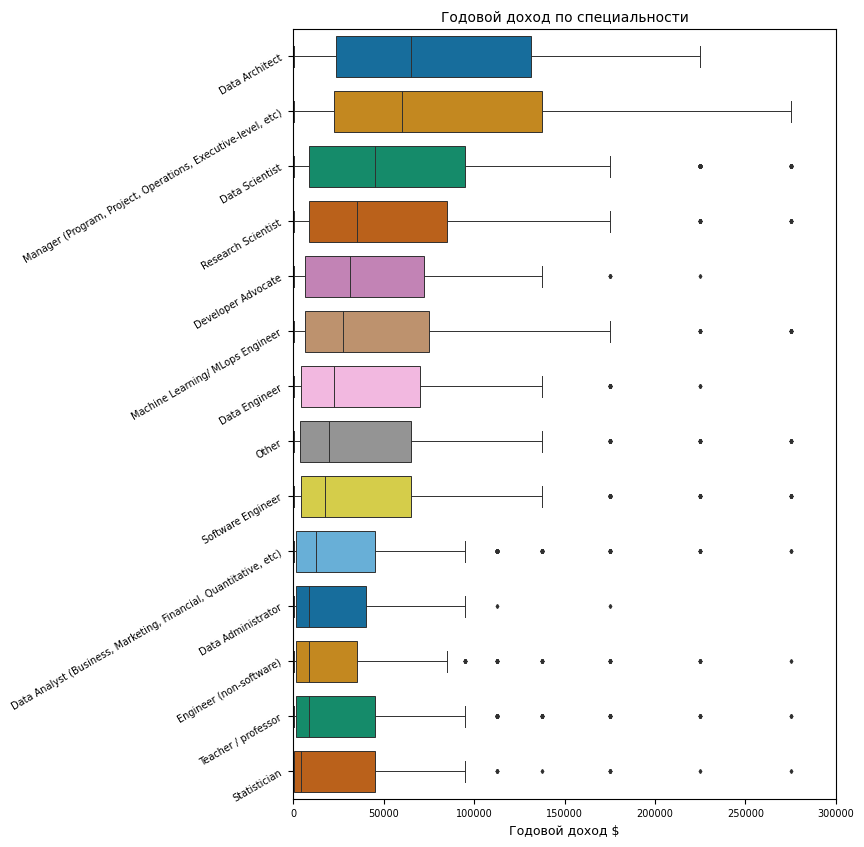

In [11]:
data = pd.read_csv('../datasets/kaggle_survey_2022_responses.csv', low_memory=False)
data.drop(0, inplace=True)
name2question = data.iloc[0] 

import seaborn as sb
income_mapping = {}
income_data = data['Q29']
income_data = income_data.drop(income_data.index[0])

for index, value in income_data.items():
    if isinstance(value, str):
        if value == '>$1,000,000':
            income_mapping[value] = 1000000
        else:
            range_split = value.split('-')
            if len(range_split) == 2:
                range_start = int(range_split[0].replace(',', '').strip('$'))
                range_end = int(range_split[1].replace(',', ''))
                range_mean = round((range_start + range_end) / 2)
                income_mapping[value] = range_mean

specialty_income = data[['Q23', 'Q29']].copy()
specialty_income = specialty_income.drop(specialty_income.index[0]).dropna()
specialty_income['Income'] = specialty_income['Q29'].map(income_mapping)
specialty_median_income = specialty_income.groupby('Q23')['Income'].median().sort_values(ascending=False)

plt.figure(figsize=(7,10))
boxplot=sns.boxplot(x='Income', y='Q23', data=specialty_income, 
                      order=specialty_median_income.index, 
                      palette='colorblind',                      
                      fliersize=2, 
                      width=0.75, 
                      linewidth=0.7)
plt.title('Годовой доход по специальности', fontsize=10)
plt.xlabel('Годовой доход $', fontsize=9)
plt.yticks(rotation=30, fontsize=7)
plt.xlim(0, 300000)
plt.xticks(fontsize=7)
plt.ylabel('')
plt.show()

In [12]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
positions = ['Data Administrator', 'Data Analyst (Business, Marketing, Financial, Quantitative, etc)', 'Data Engineer',
             'Data Scientist', 'Engineer (non-software)', 'Machine Learning/ MLops Engineer', 'Research Scientist',
             'Software Engineer', 'Data Architect']
headings = ['Data Administrator', 'Data Analyst', 'Data Engineer',
             'Data Scientist', 'Engineer', 'MLops Engineer', 'Research Scientist',
             'Software Engineer', 'Data Architect']
fig = make_subplots(rows=3, cols=3, subplot_titles=[f'<b><i>{title}</b></i>' for title in headings],
                   horizontal_spacing=0.1, vertical_spacing=0.2)
for i, position in enumerate(positions):
    position_age = data[data['Q23'] == position]['Q2'].value_counts().sort_index()    
    fig.add_trace(go.Bar(x=position_age.index, y=position_age.values, name=headings[i]),
                  row=(i // 3) + 1, col=(i % 3) + 1)
fig.update_layout(title='<i>Распределение возрастов по специальностям</i>', showlegend=True)
fig.show()

In [13]:
# Код тут
data_new1=data.groupby(['Q4'], as_index=False).agg({'Q3':'count'})
data_new1.drop(19, inplace=True)
data_new1.drop(34, inplace=True)
data_new1.rename(columns={'Q4':'Страна'}, inplace=True)

fig = px.choropleth(data_new1, locationmode="country names", locations="Страна", color='Q3',
                   color_continuous_scale="Viridis", range_color=(0, 1000), 
                   labels={'Q3':'Количество респондентов'})
fig.update_layout(title_text='<b>Карта мира<b>', title_x=0.5, width=800, height=600)
fig.show()

C:\Users\Margarita\AppData\Local\Programs\Python\Python310\lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\Margarita\AppData\Local\Programs\Python\Python310\lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

FixedFormatter should only be used together with FixedLocator

MovieWriter imagemagick unavailable; using Pillow instead.


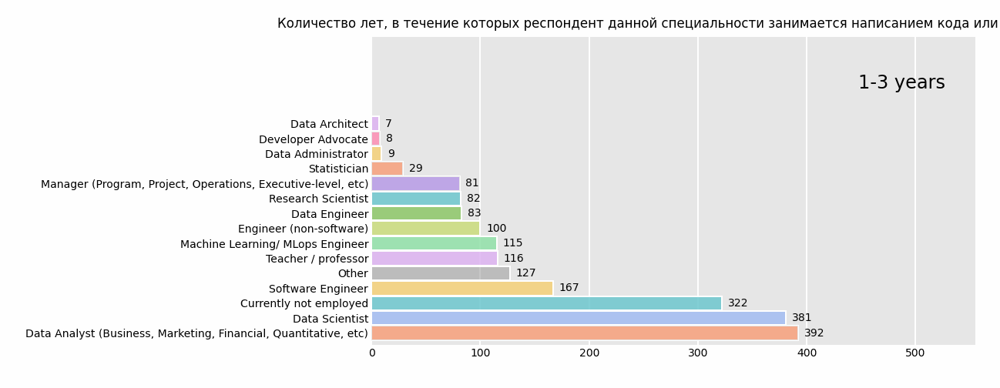

In [15]:
# Код тут
from IPython.display import Image
data.rename(columns={'Q11':'Количество лет в программировании', 'Q23':'Специальность'}, inplace=True)
data_new2=pd.crosstab(data['Количество лет в программировании'], data['Специальность'])
data_new2.tail(3)
df_values, df_ranks = bcr.prepare_wide_data(data_new2, steps_per_period=4, sort='desc')
df_values
df_ranks
bcr.bar_chart_race(filename='Yabadabadoo.gif', cmap='pastel',
                  title='Количество лет, в течение которых респондент данной специальности занимается написанием кода или программ', title_size='smaller',
                  df=data_new2,
                  orientation='h',
                  sort='asc',
                  n_bars=20, fixed_max=True, 
                  steps_per_period=50,
                  period_length=4000)
Yabadabadoo = 'Yabadabadoo.gif'
Image(Yabadabadoo)
